### Exploratory Text Analytics on COVID Papers
### Binyong Liang

# I. Load PDF, data clean up, and convert to LIB and DOC tables

In [1]:
import pandas as pd
import numpy as np
from numpy.linalg import norm
from scipy.spatial.distance import pdist
import re
from tika import parser
from glob import glob
import nltk

### The rest of data loading code do not need to be run every single time, go directly to the load CSV file section 

In [2]:
articles = [i for i in sorted(glob('data/*.pdf'))]

In [3]:
len(articles)

93

In [6]:
#load in all articlea, and clean up

art_lines=[]
my_lib=[]
for article in articles:
    raw = parser.from_file(article)
    paper_id = int(re.split(r'ms-?|\.',article)[1])

    if 'Author' in raw['metadata'].keys():
        authors=raw['metadata']['Author']
    else:
        authors=[]
    if 'title' in raw['metadata'].keys():
        title=raw['metadata']['title']
    else:
        title=[]

    paper=raw['content']
    
    #split text to lines
    lines=paper.split('\n\n')

    #delete empty lines, strip null characters
    lines=[x for x in lines if x !='']
    lines=[x.strip() for x in lines ]

    #delete lines with length less than 12 characters
    #lines=[x for x in lines if len(x)>=12]

    #delete duplicate title
    if lines[1][:10].lower()==lines[0][:10].lower():
        del lines[1]
    
    #for papers do not have title and authors in metadata:
    if authors==[]:
        authors=lines[1]
    if title==[]:
        title=lines[0]

    #delete all hyperlinks
    lines=[x for x in lines if "http" not in x]
    

    #extract the year of publication
    doiline=[i for i, x in enumerate(lines) if re.search('published in final edited form',x.lower())]
    doilist=re.split(' |\(',lines[doiline[0]])
    year=int([x for x in doilist if re.search('^\d{4}$',x)][0])
    
    #remove title, authors, and abstract
    lines=lines[3:]
    titleline=[i for i, x in enumerate(lines) if re.search('^abstract$',x.lower()) or \
                                            re.search('^([1-9]. |)background$', x.lower()) or \
                                            re.search('^([1-9]. |)introduction$',x.lower())]
    if titleline != []:
        lines=lines[titleline[-1]:]
    
    #setting dataframe
    df = pd.DataFrame(lines, columns=['line_str'])
    df.index.name = 'line_num'
    df['paper_id'] = paper_id
    
    #Chunk by page
    page_lines = [i for i, x in enumerate(lines) if re.search('Author manuscript',x)]
    page_nums = [int(i+1) for i in range(len(page_lines))]
    df.loc[page_lines, 'page_num'] = page_nums
    df.page_num = df.page_num.bfill()

    #delete additional formating lines in pdf
    df=df[~df.line_str.str.contains('Author manuscript')]
    df=df[~df.line_str.str.contains('Page ')]
    df=df[~df.line_str.str.contains('final edited form')]
    df=df[~df.line_str.str.contains('Corresponding author')]
        
    # split the row again
    df['line_str'] = df['line_str'].str.split('\n')
    df=df.explode('line_str').reset_index()
    
    #delete all references, appendix, acknowledgement, conclusion
    refline=[i for i, x in enumerate(df.line_str) if re.search('^([1-9]. |)references?:?$',x.lower()) or \
                                        re.search('^([1-9]. |)bibliography:?$',x.lower()) or \
                                        re.search('^([1-9]. |)appendix',x.lower()) or \
                                        re.search('^([1-9]. |)acknowledge?ment', x.lower()) or \
                                        re.search('^([1-9]. |)fundings?$',x.lower()) or \
                                        re.search('^([1-9]. |)supplementary material',x.lower()) or \
                                        re.search('^([1-9]. |)summary$', x.lower()) or \
                                        re.search('^([1-9]. |)conclusions?$',x.lower())]
    if refline != []:
        df=df[:refline[0]]
    
    #delete rows with less than 20 characters
    df=df[df['line_str'].map(len)>20]
    
    df = df.reset_index().set_index(['paper_id'])
    my_lib.append((paper_id, title, authors, year))
    art_lines.append(df)

In [7]:
#LIB and DOC table

LIB = pd.DataFrame(my_lib, columns=['paper_id','title', 'author','year']).set_index('paper_id')

DOC = pd.concat(art_lines)
DOC = DOC.drop('line_num',1).rename({'index':'line_num'},axis=1)
DOC.page_num = DOC.page_num.astype(int) 
DOC = DOC.reset_index().set_index(['paper_id','page_num','line_num'])

In [8]:
pd.set_option('display.max_rows', None)
LIB.groupby(['year']).size()

year
2010     8
2011    15
2012     4
2013    15
2014     7
2015     3
2016    15
2017    10
2018     8
2019     4
2020     4
dtype: int64

In [9]:
pd.set_option('display.max_rows', None)
LIB.sort_values(['year'])

,title,author,year
paper_id,,,
276596,ANTIVIRAL COMPOUNDS IN THE PIPELINE TO TACKLE ...,J.H. Beigel\nScience Applications Internationa...,2010
179039,Emerging studies of human HIV-specific antibod...,"Mark D. Hicara, Spyros A. Kalamsb,c, Paul W. S...",2010
200262,Characterization of the Gene Expression Profil...,"Aaron Yun Chen1,#, Fang Cheng1,#, Sai Lou1,2, ...",2010
201042,Mutation of Asn28 disrupts the dimerization an...,"Jennifer Barrila‡, Sandra B. Gabelli§, Usman B...",2010
219787,Ecology of avian influenza viruses in a changi...,"Kurt J. Vandegrift1, Susanne H. Sokolow2, Pete...",2010
204781,Inhibition of Heat-Shock Protein 90 Reduces Eb...,"Darci R. Smith1, Sarah McCarthy1, Andrew Chrov...",2010
209969,Simulating School Closure Strategies to Mitiga...,"Bruce Y. Lee, MD, MBA,\nAssistant Professor of...",2010
219385,HETEROLOGOUS IMMUNITY BETWEEN VIRUSES,"Raymond M. Welsh, Jenny Che, Michael A. Brehm#...",2010
746332,Osteonecrosis in Children After Therapy for Ma...,"Sue C. Kaste1,2,3, Evguenia J. Karimova4, and ...",2011


In [10]:
pd.set_option('display.max_rows', 10)
DOC

line_str
paper_id page_num line_num                                                   
1017171  1        1         Protocells, as the most simplified prototype o...
                  2         to mimic some basic cellular behaviors, such a...
                  3         directed protein translation,1,2 cell–cell com...
                  4         3–8 Such kinds of protocells, though powerful ...
                  5         sometimes are not very “smart” from the perspe...
...                                                                       ...
978331   13       974       Finally, one concern with regard to inducing b...
                  975       autoreactivity among some bnAbs, tolerance che...
                  976       responses (126, 143, 144). Indeed, this may li...
                  977       one would presume that, in a polyclonal respon...
                  978            autoreactivity would appear and be selected.

[33949 rows x 1 columns]

# II. Tokenize and Annotate

In [11]:
OHCO = ['paper_id', 'page_num', 'line_num', 'token_num']

In [12]:
def tokenize(df, OHCO=OHCO, remove_pos_tuple=False, ws=False):
    
    # Lines to Tokens
    # Local function to pick tokenizer
    def word_tokenize(x):
        if ws:
            s = pd.Series(nltk.pos_tag(nltk.WhitespaceTokenizer().tokenize(x)))
        else:
            s = pd.Series(nltk.pos_tag(nltk.word_tokenize(x)))
        return s
            
    df = df.line_str\
        .apply(word_tokenize)\
        .stack()\
        .to_frame()\
        .rename(columns={0:'pos_tuple'})
    
    # Grab info from tuple
    df['pos'] = df.pos_tuple.apply(lambda x: x[1])
    df['token_str'] = df.pos_tuple.apply(lambda x: x[0])
    if remove_pos_tuple:
        df = df.drop('pos_tuple', 1)
    
    # Add index
    df.index.names = OHCO
    
    return df

In [13]:
TOKEN = tokenize(DOC, ws=True)

In [14]:
TOKEN.head()

pos_tuple  pos    token_str
paper_id page_num line_num token_num                                      
1017171  1        1        0          (Protocells,, NNP)  NNP  Protocells,
                           1                    (as, IN)   IN           as
                           2                   (the, DT)   DT          the
                           3                 (most, RBS)  RBS         most
                           4            (simplified, JJ)   JJ   simplified

## Create VOCAB table

* clean up token_str, remove non-word characters, remove trailing numbers since these are used for references, a common trait in scientific papers

In [15]:
TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '').str.rstrip('1234567890.')

In [16]:
VOCAB = TOKEN.term_str.value_counts().to_frame().rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'

In [17]:
#add pos_max into VOCAB table
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)

In [18]:
VOCAB['num'] = VOCAB.term_str.str.match("\d+").astype('int')

In [19]:
VOCAB.sample(10)

,term_str,n,pos_max,num
term_id,,,,
277,2009and,1,CD,1
22441,triphosphatases,1,NNS,0
6614,diffusional,1,JJ,0
15857,oswaldo,1,NNP,0
15202,nonphysiologic,1,JJ,0
18094,q,16,NNP,0
7450,electrofusion,1,NN,0
8705,flavonoid,1,JJ,0
15469,objectives,11,NNS,0


In [20]:
VOCAB.shape

(24176, 4)

## Annotate and Stemming

In [21]:
sw = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1

In [22]:
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')

In [23]:
from nltk.stem.porter import PorterStemmer

stemmer = PorterStemmer()
VOCAB['p_stem'] = VOCAB.term_str.apply(stemmer.stem)

In [24]:
VOCAB.sample(10)

,term_str,n,pos_max,num,stop,p_stem
term_id,,,,,,
3881,cardiomyocyte,8,NN,0,0,cardiomyocyt
6025,database,28,NN,0,0,databas
15970,overwhelmingly,1,RB,0,0,overwhelmingli
1616,alphaviral,6,JJ,0,0,alphavir
809,7f,5,CD,1,0,7f
10983,immunomodulators,2,NNS,0,0,immunomodul
2051,antitag,1,NN,0,0,antitag
1524,alexafluor,2,JJ,0,0,alexafluor
8374,fam53b,1,NNP,0,0,fam53b


## Save, and do not have to run above codes everytime

In [25]:
DOC.to_csv('DOC.csv')
LIB.to_csv('LIB.csv')
VOCAB.to_csv('VOCAB.csv')
TOKEN.to_csv('TOKEN.csv')

# III. TFIDF table

## Load csv files in order to save time

In [26]:
OHCO = ['paper_id', 'page_num', 'line_num', 'token_num']

TOKEN = pd.read_csv('TOKEN.csv').set_index(OHCO)
VOCAB = pd.read_csv('VOCAB.csv').set_index('term_id')
LIB=pd.read_csv('LIB.csv').set_index('paper_id')
DOC=pd.read_csv('DOC.csv').set_index(OHCO[:3])

In [27]:
# default input options: 
# level='paper', count_method='n', tf_method='sum', idf_method='standard'

def TFIDFmatrix(TOKEN, level='paper', count_method='n', tf_method='sum', idf_method='standard'):
    
    OHCO = ['paper_id', 'page_num', 'line_num', 'token_num']
    
    if level == 'paper':
        bag = OHCO[:1]
    elif level == 'page':
        bag = OHCO[:2]
    elif level == 'line':
        bag = OHCO[:3]
    else:
        print('invalid OHCO level selection, only following levels allowed:\n')
        print('paper, page, line\n')
        return  
    if count_method not in ['c','n']:
        print('invalid count_method selection, only following methods allowed:\n')
        print('n, c (n for tokens counts, c for distinct token counts)\n')
        return         
    
    if tf_method  not in ['sum','max','log','raw','double_norm','binary']:
        print('invalid tf_method selection, only following methods allowed:\n')
        print('sum, max, log, raw, double_norm, binary\n')
        return 
    
    if idf_method not in ['standard','max','smooth']:
        print('invalid idf_method selection, only following methods allowed:\n')
        print('standard, max, smooth\n')
        return        

    BOW = TOKEN.groupby(bag+['term_id']).term_id.count()\
        .to_frame().rename(columns={'term_id':'n'})
    BOW['c'] = BOW.n.astype('bool').astype('int')
    DTCM = BOW[count_method].unstack().fillna(0).astype('int')
    
    if tf_method == 'sum':
        TF = DTCM.T / DTCM.T.sum()
    elif tf_method == 'max':
        TF = DTCM.T / DTCM.T.max()
    elif tf_method == 'log':
        TF = np.log10(1 + DTCM.T)
    elif tf_method == 'raw':
        TF = DTCM.T
    elif tf_method == 'double_norm':
        TF = DTCM.T / DTCM.T.max()
        TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0] # EXPLAIN; may defeat purpose of norming
    elif tf_method == 'binary':
        TF = DTCM.T.astype('bool').astype('int')

    TF=TF.T
    
    DF = DTCM[DTCM > 0].count()
    N = DTCM.shape[0]
    
    if idf_method == 'standard':
        IDF = np.log10(N / DF)
    elif idf_method == 'max':
        IDF = np.log10(DF.max() / (1 + DF)) 
    elif idf_method == 'smooth':
        IDF = np.log10(N / (1 + DF)) + 1

    
    TFIDF = TF * IDF
    return(TFIDF,DTCM)
    

In [28]:
out=TFIDFmatrix(TOKEN)
tfidf=out[0]

In [29]:
tfidf.shape

(93, 24176)

In [30]:
VOCAB['tfidf_paper_sum']=tfidf.sum()

In [31]:
pd.set_option('display.max_rows', 20)
VOCAB.sort_values('tfidf_paper_sum',ascending=False).head(20)

,term_str,n,pos_max,num,stop,p_stem,tfidf_paper_sum
term_id,,,,,,,
5598,covid,86,NNP,0,0,covid,0.089514
9928,hbov,222,NNP,0,0,hbov,0.086890
7966,et,1840,CC,0,0,et,0.078284
4166,cells,2248,NNS,0,0,cell,0.073709
1485,al,1836,RB,0,0,al,0.072979
1054,ace,222,NNP,0,0,ace,0.068110
2352,ask,115,NNP,0,0,ask,0.066521
4049,cd,689,NNP,0,0,cd,0.065696
15850,osteonecrosis,82,NN,0,0,osteonecrosi,0.059695


It is interesting to note that COVID is the top ranked vocabulary when we use paper as our bag. COVID is a relatively new word, coined by the UN WHO in Februrary 2020. We only have 4 papers that were published since Feb 2020, it is very likely that this word is heavily used in these 4 papers, whereas no other words have such high specificity.   

In [32]:
out=TFIDFmatrix(TOKEN, level='page')
tfidf2=out[0]
DTCM=out[1]

In [373]:
tfidf2.shape

(914, 24176)

In [34]:
VOCAB['tfidf_page_sum']=tfidf2.sum()

In [35]:
VOCAB.sort_values('tfidf_page_sum',ascending=False).head(20)

,term_str,n,pos_max,num,stop,p_stem,tfidf_paper_sum,tfidf_page_sum
term_id,,,,,,,,
7966,et,1840,CC,0,0,et,0.078284,1.910604
1485,al,1836,RB,0,0,al,0.072979,1.896648
4166,cells,2248,NNS,0,0,cell,0.073709,1.637269
9977,health,622,NN,0,0,health,0.049710,1.339397
21457,t,923,NNP,0,1,t,0.048938,1.313180
23621,were,3043,VBD,0,1,were,0.009424,1.143244
4049,cd,689,NNP,0,0,cd,0.065696,1.118652
23316,virus,1086,NN,0,0,viru,0.038839,1.063575
16291,patients,563,NNS,0,0,patient,0.038400,0.956205


In [368]:
#save updated VOCAB file
VOCAB.to_csv('VOCAB_withtfidf.csv')

## Reduce the number of features by dropping insignificant words (based on tfidf_page_sum), do not drop proper nouns since that will also drop some important biological terms, such as COVID.

In [36]:
SIGS=VOCAB.sort_values('tfidf_page_sum',ascending = False).iloc[:4000]

In [369]:
SIGS.to_csv('SIGS.csv')

In [37]:
#TFIDF2 is the reduced TFIDF2 table, based on SIGS table, total columns less than 4000
#DTCM2 is the reduced DTCM table, similarly
TFIDF2=tfidf2[SIGS.index.tolist()]
DTCM2=DTCM[SIGS.index.tolist()]

In [38]:
SIGS.shape

(4000, 8)

In [39]:
TFIDF2.head(5)

term_id               7966      1485      4166   9977      21457     23621  \
paper_id page_num                                                            
4909     1         0.000000  0.000000  0.000000    0.0  0.000000  0.000000   
         2         0.001907  0.001902  0.005780    0.0  0.025826  0.000000   
         3         0.020633  0.020570  0.007642    0.0  0.020585  0.000345   
         4         0.015073  0.015028  0.003807    0.0  0.016113  0.000945   
         5         0.018364  0.018308  0.010512    0.0  0.026173  0.001841   

term_id               4049   23316     16291  23537  ...  8857   10137  3179   \
paper_id page_num                                    ...                        
4909     1         0.000000    0.0  0.008554    0.0  ...    0.0    0.0    0.0   
         2         0.015246    0.0  0.005171    0.0  ...    0.0    0.0    0.0   
         3         0.006597    0.0  0.002797    0.0  ...    0.0    0.0    0.0   
         4         0.003012    0.0  0.010217    0.0  ...    0.0    0.0    0.0   
         5         0.008807    0.0  0.002489    0.0  ...    0.0    0.0    0.0   

term_id            4730   1889   16821  19918  11045  8533   19293  
paper_id page_num                                                   
4909     1           0.0    0.0    0.0    0.0    0.0    0.0    0.0  
         2           0.0    0.0    0.0    0.0    0.0    0.0    0.0  
         3           0.0    0.0    0.0    0.0    0.0    0.0    0.0  
         4           0.0    0.0    0.0    0.0    0.0    0.0    0.0  
         5           0.0    0.0    0.0    0.0    0.0    0.0    0.0  

[5 rows x 4000 columns]

## GROUP TFIDF2 on paper_id, create DOC table, Normalize and create DOC pair table

In [40]:
TFIDF2=TFIDF2.groupby('paper_id').mean()

In [41]:
TFIDF2

term_id,7966,1485,4166,9977,21457,23621,4049,23316,16291,23537,...,8857,10137,3179,4730,1889,16821,19918,11045,8533,19293
paper_id,,,,,,,,,,,,,,,,,,,,,
4909,0.017374,0.017321,0.005973,0.000000,0.017273,0.000591,0.010437,0.000144,0.006110,0.000330,...,0.0,0.000186,0.00000,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000
179039,0.000160,0.000160,0.002801,0.000000,0.001558,0.001024,0.000000,0.001018,0.000452,0.001490,...,0.0,0.000000,0.00063,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000
200262,0.011568,0.011532,0.002739,0.000175,0.000000,0.002351,0.000000,0.000992,0.000715,0.001599,...,0.0,0.000000,0.00000,0.0,0.0,0.0,0.001653,0.0000,0.0,0.000000
201042,0.000318,0.000317,0.000389,0.000000,0.000000,0.001194,0.000000,0.000000,0.000000,0.000347,...,0.0,0.000000,0.00000,0.0,0.0,0.0,0.000000,0.0000,0.0,0.001972
204781,0.003929,0.003796,0.001991,0.000000,0.000000,0.001870,0.000000,0.003860,0.000000,0.001244,...,0.0,0.000000,0.00000,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1571235,0.009634,0.009605,0.000591,0.000000,0.000221,0.001585,0.000000,0.000497,0.000000,0.001662,...,0.0,0.000000,0.00000,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000956
1593222,0.000386,0.000384,0.000000,0.000000,0.000000,0.000129,0.000000,0.000317,0.012476,0.000247,...,0.0,0.000000,0.00000,0.0,0.0,0.0,0.000000,0.0032,0.0,0.000000
1596769,0.000575,0.000573,0.002173,0.000468,0.003679,0.002813,0.002123,0.000249,0.000000,0.000607,...,0.0,0.000000,0.00000,0.0,0.0,0.0,0.000536,0.0000,0.0,0.000000


In [42]:
DOC=LIB.reset_index()

In [43]:
DOC['title_year'] = DOC['year'].astype(str)+' '+DOC['title']

In [44]:
DOC

,paper_id,title,author,year,title_year
0,1017171,Constructing Smart Protocells with Built-In DN...,"Yifan Lyu, Cuichen Wu, Charles Heinke, Da Han,...",2018,2018 Constructing Smart Protocells with Built-...
1,1022449,The National Ebola Training and Education Cent...,"Christopher J. Kratochvil, Laura Evans, Bruce ...",2017,2017 The National Ebola Training and Education...
2,1047526,Remdesivir (GS-5734) protects African green mo...,"Michael K. Lo, Friederike Feldmann, Joy M. Gar...",2019,2019 Remdesivir (GS-5734) protects African gre...
3,1061612,Public Health Surveillance: At the Core of the...,"Sara Beth Wolicki, Jennifer B. Nuzzo, David L....",2016,2016 Public Health Surveillance: At the Core o...
4,1528726,Interferon Regulatory Factor 3 plays a role in...,"Zachary P. Guinn, Thomas M. Petro",2019,2019 Interferon Regulatory Factor 3 plays a ro...
...,...,...,...,...,...
88,960656,Broad-spectrum agents for flaviviral infection...,"Veaceslav Boldescu, Mira A. M. Behnam, Nikos V...",2017,2017 Broad-spectrum agents for flaviviral infe...
89,967517,Developmental regulation of effector and resid...,"Thomas J. Connors, J. Scott Baird, Margot C. Y...",2018,2018 Developmental regulation of effector and ...
90,968237,Excessive glutamate stimulation impairs ACE2 a...,"Xu Jiaxi, Srinivas Sriramula, Eric Lazartigues",2018,2018 Excessive glutamate stimulation impairs A...
91,971088,Top-Down Chemoenzymatic Approach to Synthesizi...,"Christian Toonstra, Lisa Wu, Chao Li, Denong W...",2018,2018 Top-Down Chemoenzymatic Approach to Synth...


In [45]:
L0 = TFIDF2.astype('bool').astype('int')
L1 = TFIDF2.apply(lambda x: x / x.sum(), 1)
L2 = TFIDF2.apply(lambda x: x / norm(x), 1)

In [46]:
((L2.T)**2).sum()

paper_id
4909       1.0
179039     1.0
200262     1.0
201042     1.0
204781     1.0
          ... 
1571235    1.0
1593222    1.0
1596769    1.0
1598913    1.0
1601447    1.0
Length: 93, dtype: float64

In [47]:
((L1.T)).sum()

paper_id
4909       1.0
179039     1.0
200262     1.0
201042     1.0
204781     1.0
          ... 
1571235    1.0
1593222    1.0
1596769    1.0
1598913    1.0
1601447    1.0
Length: 93, dtype: float64

In [48]:
PAIRS = pd.DataFrame(index=pd.MultiIndex.from_product([DOC.index.tolist(), DOC.index.tolist()])).reset_index()
PAIRS = PAIRS[PAIRS.level_0 < PAIRS.level_1].set_index(['level_0','level_1'])
PAIRS.index.names = ['doc_a', 'doc_b']

In [49]:
PAIRS.shape

(4278, 0)

## Compute Distances

In [50]:
PAIRS['cityblock'] = pdist(TFIDF2, 'cityblock')
PAIRS['euclidean'] = pdist(TFIDF2, 'euclidean')
PAIRS['cosine'] = pdist(TFIDF2, 'cosine')
PAIRS['jaccard'] = pdist(L0, 'jaccard')
PAIRS['dice'] = pdist(L0, 'dice')
PAIRS['js'] = pdist(L1, 'jensenshannon')
PAIRS['euclidean2'] = pdist(L2, 'euclidean')
PAIRS['correlation'] = pdist(L2, 'correlation')
PAIRS['kulsinski'] = pdist(L0, 'kulsinski')

In [51]:
import seaborn as sns
sns.set(style="ticks")

%matplotlib inline

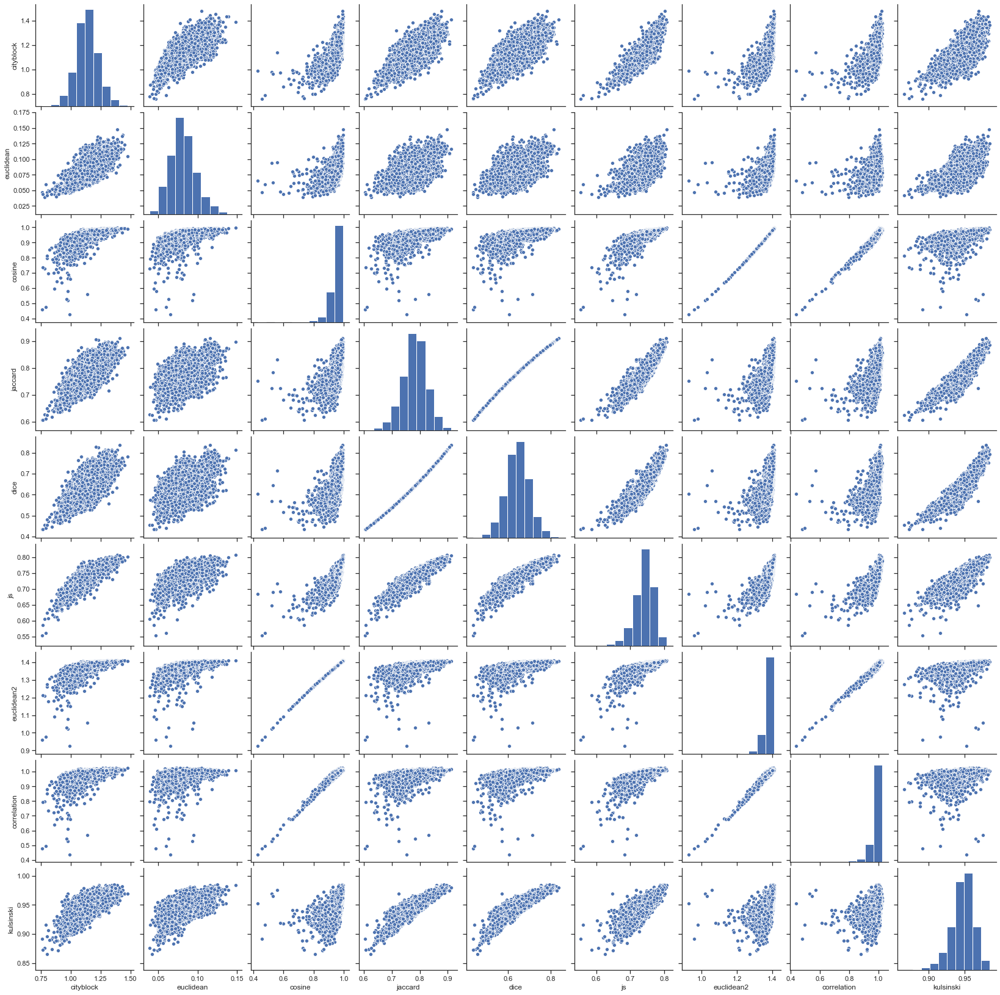

In [52]:
sns.pairplot(PAIRS)

In [53]:
PAIRS.sort_values('cosine').style.background_gradient('YlGn')

# IV. Create Clusters, Hierarchical

In [54]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

In [55]:
def hca(sims, linkage_method='ward', color_thresh=.3, figsize=(10, 10)):
    tree = sch.linkage(sims, method=linkage_method)
    labels = DOC.title_year.values
    plt.figure(figsize=(20,10))
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels, 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14)

<Figure size 1440x720 with 0 Axes>

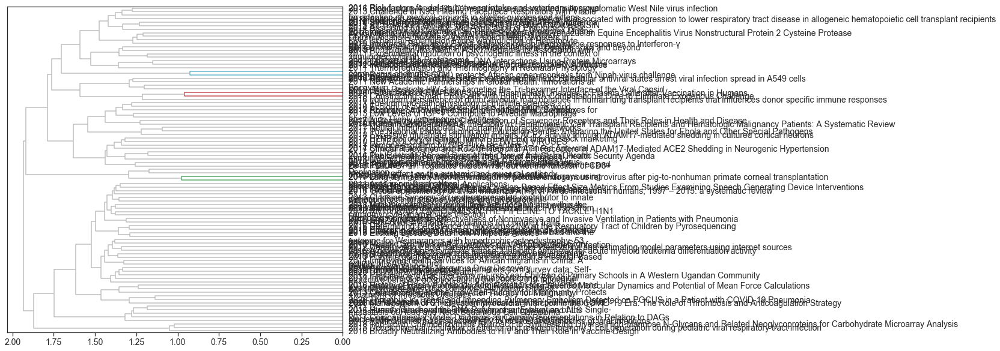

In [56]:
hca(PAIRS.euclidean2, color_thresh=1)

# V. PCA analysis and Loading

## Normalize and center doc vector lengths, but not variance

In [57]:
TFIDF2.head(5)

term_id,7966,1485,4166,9977,21457,23621,4049,23316,16291,23537,...,8857,10137,3179,4730,1889,16821,19918,11045,8533,19293
paper_id,,,,,,,,,,,,,,,,,,,,,
4909,0.017374,0.017321,0.005973,0.000000,0.017273,0.000591,0.010437,0.000144,0.006110,0.000330,...,0.0,0.000186,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
179039,0.000160,0.000160,0.002801,0.000000,0.001558,0.001024,0.000000,0.001018,0.000452,0.001490,...,0.0,0.000000,0.00063,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
200262,0.011568,0.011532,0.002739,0.000175,0.000000,0.002351,0.000000,0.000992,0.000715,0.001599,...,0.0,0.000000,0.00000,0.0,0.0,0.0,0.001653,0.0,0.0,0.000000
201042,0.000318,0.000317,0.000389,0.000000,0.000000,0.001194,0.000000,0.000000,0.000000,0.000347,...,0.0,0.000000,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.001972
204781,0.003929,0.003796,0.001991,0.000000,0.000000,0.001870,0.000000,0.003860,0.000000,0.001244,...,0.0,0.000000,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000


In [58]:
TFIDF2 = TFIDF2.apply(lambda x: x / np.sqrt(np.square(x).sum()), 1)

In [59]:
TFIDF2.head(5)

term_id,7966,1485,4166,9977,21457,23621,4049,23316,16291,23537,...,8857,10137,3179,4730,1889,16821,19918,11045,8533,19293
paper_id,,,,,,,,,,,,,,,,,,,,,
4909,0.340292,0.339254,0.116996,0.000000,0.338329,0.011577,0.204429,0.002829,0.119680,0.006462,...,0.0,0.003653,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000
179039,0.004211,0.004198,0.073566,0.000000,0.040925,0.026897,0.000000,0.026745,0.011881,0.039138,...,0.0,0.000000,0.016558,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000
200262,0.179200,0.178653,0.042424,0.002707,0.000000,0.036423,0.000000,0.015362,0.011072,0.024771,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.025604,0.0,0.0,0.00000
201042,0.007640,0.007617,0.009350,0.000000,0.000000,0.028712,0.000000,0.000000,0.000000,0.008344,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.04742
204781,0.077510,0.074899,0.039275,0.000000,0.000000,0.036902,0.000000,0.076148,0.000000,0.024536,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000


In [60]:
TFIDF2 = TFIDF2 - TFIDF2.mean()

In [61]:
TFIDF2.head(5)

term_id,7966,1485,4166,9977,21457,23621,4049,23316,16291,23537,...,8857,10137,3179,4730,1889,16821,19918,11045,8533,19293
paper_id,,,,,,,,,,,,,,,,,,,,,
4909,0.308442,0.307655,0.088413,-0.024170,0.316263,-0.010550,0.186012,-0.021274,0.099389,-0.013413,...,-0.000531,0.002661,-0.001042,-0.001356,-0.001341,-0.001189,-0.000944,-0.001,-0.00106,-0.001034
179039,-0.027639,-0.027401,0.044983,-0.024170,0.018860,0.004770,-0.018418,0.002642,-0.008410,0.019263,...,-0.000531,-0.000992,0.015516,-0.001356,-0.001341,-0.001189,-0.000944,-0.001,-0.00106,-0.001034
200262,0.147350,0.147054,0.013841,-0.021463,-0.022066,0.014296,-0.018418,-0.008741,-0.009219,0.004896,...,-0.000531,-0.000992,-0.001042,-0.001356,-0.001341,-0.001189,0.024660,-0.001,-0.00106,-0.001034
201042,-0.024209,-0.023982,-0.019233,-0.024170,-0.022066,0.006584,-0.018418,-0.024103,-0.020291,-0.011531,...,-0.000531,-0.000992,-0.001042,-0.001356,-0.001341,-0.001189,-0.000944,-0.001,-0.00106,0.046387
204781,0.045661,0.043300,0.010693,-0.024170,-0.022066,0.014775,-0.018418,0.052045,-0.020291,0.004661,...,-0.000531,-0.000992,-0.001042,-0.001356,-0.001341,-0.001189,-0.000944,-0.001,-0.00106,-0.001034


## Compute Covariance Matrix

In [62]:
COV = TFIDF2.cov()

In [63]:
COV.head()

term_id,7966,1485,4166,9977,21457,23621,4049,23316,16291,23537,...,8857,10137,3179,4730,1889,16821,19918,11045,8533,19293
term_id,,,,,,,,,,,,,,,,,,,,,
7966,0.005218,0.005189,0.000452,-0.000437,0.000793,-0.000055,0.000241,0.000097,0.000003,-0.000092,...,-0.000011,0.000011,-2.375115e-05,-0.000021,0.000069,0.000008,0.000034,-0.000030,-0.000030,0.000030
1485,0.005189,0.005163,0.000454,-0.000490,0.000794,-0.000051,0.000254,0.000096,0.000006,-0.000090,...,-0.000011,0.000011,-2.351748e-05,-0.000021,0.000069,0.000008,0.000034,-0.000030,-0.000030,0.000029
4166,0.000452,0.000454,0.001731,-0.000639,0.001573,0.000160,0.001252,0.000372,-0.000145,-0.000015,...,0.000041,-0.000008,4.216098e-07,-0.000039,-0.000029,-0.000022,0.000002,-0.000029,0.000007,-0.000010
9977,-0.000437,-0.000490,-0.000639,0.005453,-0.000465,-0.000248,-0.000414,-0.000369,-0.000178,-0.000130,...,-0.000012,-0.000021,-2.199090e-05,-0.000033,-0.000024,-0.000023,-0.000020,0.000065,-0.000014,-0.000022
21457,0.000793,0.000794,0.001573,-0.000465,0.004099,0.000046,0.002611,-0.000117,0.000299,0.000112,...,-0.000007,-0.000008,-4.034821e-06,-0.000030,-0.000025,-0.000025,-0.000009,-0.000022,0.000027,-0.000022


In [64]:
COV.iloc[:5,:10].style.background_gradient()

term_id,7966,1485,4166,9977,21457,23621,4049,23316,16291,23537
term_id,,,,,,,,,,
7966,0.005218,0.005189,0.000452,-0.000437,0.000793,-0.000055,0.000241,0.000097,0.000003,-0.000092
1485,0.005189,0.005163,0.000454,-0.000490,0.000794,-0.000051,0.000254,0.000096,0.000006,-0.000090
4166,0.000452,0.000454,0.001731,-0.000639,0.001573,0.000160,0.001252,0.000372,-0.000145,-0.000015
9977,-0.000437,-0.000490,-0.000639,0.005453,-0.000465,-0.000248,-0.000414,-0.000369,-0.000178,-0.000130
21457,0.000793,0.000794,0.001573,-0.000465,0.004099,0.000046,0.002611,-0.000117,0.000299,0.000112


## Decompose the matrix, convert eigen data to dataframes

In [65]:
from scipy.linalg import eigh

In [66]:
eig_vals, eig_vecs = eigh(COV)

In [67]:
TERM_IDX = COV.index
EIG_VEC = pd.DataFrame(eig_vecs, index=TERM_IDX, columns=TERM_IDX)
EIG_VAL = pd.DataFrame(eig_vals, index=TERM_IDX, columns=['eig_val'])
EIG_VAL.index.name = 'term_id'

In [68]:
EIG_VEC.iloc[:5, :10].style.background_gradient()

term_id,7966,1485,4166,9977,21457,23621,4049,23316,16291,23537
term_id,,,,,,,,,,
7966,0.055117,0.010866,-0.060838,0.001796,-0.068553,0.027592,-0.033768,-0.004463,-0.009365,0.030866
1485,0.003871,0.034834,0.218503,-0.011190,0.229450,0.030206,0.066936,-0.079913,-0.024245,-0.111396
4166,0.336453,0.302088,-0.034802,-0.057715,0.070891,0.064355,-0.010072,-0.219528,-0.075574,0.022174
9977,0.026485,0.398847,0.131579,-0.135428,0.070641,0.016491,0.016757,0.033827,-0.063957,0.118730
21457,-0.358103,0.213859,-0.045451,0.254468,-0.059056,-0.027551,-0.033873,-0.018106,0.025892,-0.036650


In [69]:
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)
EIG_PAIRS.head()

,eig_val,7966,1485,4166,9977,21457,23621,4049,23316,16291,...,8857,10137,3179,4730,1889,16821,19918,11045,8533,19293
term_id,,,,,,,,,,,,,,,,,,,,,
7966,-4.006991e-17,0.055117,0.003871,0.336453,0.026485,-0.358103,-0.009149,0.356833,-0.012234,-0.051522,...,-0.004692,-0.000744,-0.001624,-0.012035,-0.001052,0.000393,0.005402,0.002276,-0.002441,-0.004137
1485,-2.767562e-17,0.010866,0.034834,0.302088,0.398847,0.213859,0.228873,-0.348866,0.137385,0.115492,...,0.000453,-0.000196,0.001389,-0.009263,-0.005575,-0.000804,0.013966,0.009534,0.001461,-0.002172
4166,-2.580815e-17,-0.060838,0.218503,-0.034802,0.131579,-0.045451,-0.021365,0.242275,-0.120302,-0.113442,...,-0.000853,-0.000082,-0.002237,-0.005925,0.009078,0.000877,0.021865,-0.000893,0.000546,0.001930
9977,-2.159067e-17,0.001796,-0.011190,-0.057715,-0.135428,0.254468,-0.228874,-0.222592,0.013765,-0.097550,...,-0.000796,-0.002335,-0.002473,-0.003180,-0.001266,0.000641,0.001915,-0.005141,0.005031,-0.002282
21457,-2.022393e-17,-0.068553,0.229450,0.070891,0.070641,-0.059056,0.136321,-0.077439,-0.016757,-0.080580,...,-0.004300,-0.000050,0.001251,0.006984,-0.015183,-0.001534,-0.020833,-0.005654,0.001761,-0.002364


## Pick top K(10) Components, based on explained variance

In [70]:
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

In [71]:
EIG_PAIRS

,eig_val,7966,1485,4166,9977,21457,23621,4049,23316,16291,...,10137,3179,4730,1889,16821,19918,11045,8533,19293,exp_var
term_id,,,,,,,,,,,,,,,,,,,,,
7966,-4.006991e-17,0.055117,0.003871,0.336453,0.026485,-0.358103,-0.009149,0.356833,-0.012234,-0.051522,...,-0.000744,-0.001624,-0.012035,-0.001052,0.000393,0.005402,0.002276,-0.002441,-0.004137,-0.00
1485,-2.767562e-17,0.010866,0.034834,0.302088,0.398847,0.213859,0.228873,-0.348866,0.137385,0.115492,...,-0.000196,0.001389,-0.009263,-0.005575,-0.000804,0.013966,0.009534,0.001461,-0.002172,-0.00
4166,-2.580815e-17,-0.060838,0.218503,-0.034802,0.131579,-0.045451,-0.021365,0.242275,-0.120302,-0.113442,...,-0.000082,-0.002237,-0.005925,0.009078,0.000877,0.021865,-0.000893,0.000546,0.001930,-0.00
9977,-2.159067e-17,0.001796,-0.011190,-0.057715,-0.135428,0.254468,-0.228874,-0.222592,0.013765,-0.097550,...,-0.002335,-0.002473,-0.003180,-0.001266,0.000641,0.001915,-0.005141,0.005031,-0.002282,-0.00
21457,-2.022393e-17,-0.068553,0.229450,0.070891,0.070641,-0.059056,0.136321,-0.077439,-0.016757,-0.080580,...,-0.000050,0.001251,0.006984,-0.015183,-0.001534,-0.020833,-0.005654,0.001761,-0.002364,-0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16821,1.906816e-02,-0.184860,-0.183567,-0.023069,0.014028,0.060370,-0.022110,0.060433,-0.110477,0.003153,...,0.001932,0.004471,-0.013457,0.008771,0.006760,-0.014340,0.000210,0.002989,-0.002088,2.02
19918,1.972518e-02,-0.071251,-0.070225,-0.106547,-0.159533,-0.252509,0.009767,-0.177719,0.034490,0.018307,...,-0.001892,0.001735,-0.000917,0.011049,0.002790,-0.000524,0.001617,-0.004794,0.008729,2.09
11045,2.026516e-02,-0.077818,-0.075719,0.081731,-0.186254,0.151296,-0.009598,0.110104,0.056593,0.193710,...,0.000507,0.001148,0.003722,-0.001705,-0.001622,-0.003410,0.003818,0.001462,-0.005049,2.14


In [72]:
COMPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
COMPS.index.name = 'comp_id'
COMPS.index = ["PC{}".format(i) for i in COMPS.index.tolist()]

In [73]:
COMPS

,eig_val,7966,1485,4166,9977,21457,23621,4049,23316,16291,...,10137,3179,4730,1889,16821,19918,11045,8533,19293,exp_var
PC0,0.026146,-0.194235,-0.194922,-0.151639,0.251909,-0.139081,-0.015599,-0.105364,-0.043152,0.089979,...,-0.000303,-0.002596,0.007137,-0.003499,-0.000629,-0.003041,0.009896,0.000778,-0.004360,2.76
PC1,0.022520,0.196025,0.194895,0.018709,0.044700,0.033516,-0.029583,0.034211,-0.020879,0.096568,...,-0.002939,-0.008490,0.001306,0.011533,0.003695,0.001339,0.003405,-0.002013,-0.005354,2.38
PC2,0.020265,-0.077818,-0.075719,0.081731,-0.186254,0.151296,-0.009598,0.110104,0.056593,0.193710,...,0.000507,0.001148,0.003722,-0.001705,-0.001622,-0.003410,0.003818,0.001462,-0.005049,2.14
PC3,0.019725,-0.071251,-0.070225,-0.106547,-0.159533,-0.252509,0.009767,-0.177719,0.034490,0.018307,...,-0.001892,0.001735,-0.000917,0.011049,0.002790,-0.000524,0.001617,-0.004794,0.008729,2.09
PC4,0.019068,-0.184860,-0.183567,-0.023069,0.014028,0.060370,-0.022110,0.060433,-0.110477,0.003153,...,0.001932,0.004471,-0.013457,0.008771,0.006760,-0.014340,0.000210,0.002989,-0.002088,2.02
PC5,0.018095,-0.061442,-0.062326,0.051918,0.091007,-0.050413,-0.030270,-0.042412,0.169678,-0.070182,...,0.000187,0.000688,-0.009870,0.013244,0.000003,-0.013612,-0.003342,0.000915,-0.005034,1.91
PC6,0.017405,-0.143159,-0.140727,0.013755,-0.131153,-0.045276,0.052458,-0.003500,0.064994,-0.059299,...,-0.001098,-0.000956,0.021907,0.006719,0.002277,0.012896,-0.006778,-0.000048,-0.010017,1.84
PC7,0.016538,0.024958,0.025719,-0.081309,-0.114855,0.000849,-0.022925,-0.058079,0.002756,0.043116,...,0.005172,0.002133,0.014717,0.013512,0.004187,0.006405,-0.006287,0.004728,-0.001814,1.75
PC8,0.015940,-0.157688,-0.154727,0.044302,-0.126414,0.152754,0.029811,0.147082,-0.024768,-0.004968,...,-0.002211,-0.002660,0.009746,-0.004476,-0.002594,-0.009782,-0.003913,0.001832,0.000739,1.69
PC9,0.015195,-0.159377,-0.158209,-0.002293,-0.039681,-0.141330,-0.018355,-0.072583,-0.004092,-0.017499,...,0.001931,-0.002108,0.003120,-0.007236,0.002255,-0.002524,-0.001191,-0.000841,-0.001306,1.61


## Compute and Show Explained Variance

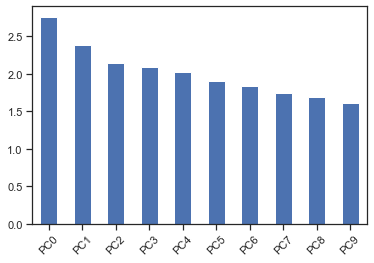

In [74]:
COMPS.exp_var.plot.bar(rot=45)

## Show Loadings

In [75]:
LOADINGS = COMPS[TERM_IDX].T
LOADINGS.index.name = 'term_id'

In [76]:
LOADINGS.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_id,,,,,,,,,,
7966,-0.194235,0.196025,-0.077818,-0.071251,-0.184860,-0.061442,-0.143159,0.024958,-0.157688,-0.159377
1485,-0.194922,0.194895,-0.075719,-0.070225,-0.183567,-0.062326,-0.140727,0.025719,-0.154727,-0.158209
4166,-0.151639,0.018709,0.081731,-0.106547,-0.023069,0.051918,0.013755,-0.081309,0.044302,-0.002293
9977,0.251909,0.044700,-0.186254,-0.159533,0.014028,0.091007,-0.131153,-0.114855,-0.126414,-0.039681
21457,-0.139081,0.033516,0.151296,-0.252509,0.060370,-0.050413,-0.045276,0.000849,0.152754,-0.141330


In [77]:
#add term_str into the LOADINGS table from SIGS table
LOADINGS['term_str'] = LOADINGS.apply(lambda x: SIGS.loc[int(x.name)].term_str, 1)

In [78]:
l0_pos = LOADINGS.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ')
l0_neg = LOADINGS.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ')
l1_pos = LOADINGS.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')
l1_neg = LOADINGS.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')

print('Books PC0+', l0_pos)
print('Books PC0-', l0_neg)
print('Books PC1+', l1_pos)
print('Books PC1-', l1_neg)

Books PC0+ health covid global china public ebola patients cases risk influenza
Books PC0- al et cells t cd ms ns irf expression ace
Books PC1+ ace adam et al ang covid glutamate patients at1r chf
Books PC1- antibody antibodies hiv gp env binding dna s bnabs protease


In [377]:
#save LOADINGS table, this table share index with the significant VOCAB table, i.e., SIGS.csv table
LOADINGS.to_csv('LOADINGS.csv')

In [457]:
LOADINGS

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,term_str
term_id,,,,,,,,,,,
7966,-0.194235,0.196025,-0.077818,-0.071251,-0.184860,-0.061442,-0.143159,0.024958,-0.157688,-0.159377,et
1485,-0.194922,0.194895,-0.075719,-0.070225,-0.183567,-0.062326,-0.140727,0.025719,-0.154727,-0.158209,al
4166,-0.151639,0.018709,0.081731,-0.106547,-0.023069,0.051918,0.013755,-0.081309,0.044302,-0.002293,cells
9977,0.251909,0.044700,-0.186254,-0.159533,0.014028,0.091007,-0.131153,-0.114855,-0.126414,-0.039681,health
21457,-0.139081,0.033516,0.151296,-0.252509,0.060370,-0.050413,-0.045276,0.000849,0.152754,-0.141330,t
...,...,...,...,...,...,...,...,...,...,...,...
16821,-0.000629,0.003695,-0.001622,0.002790,0.006760,0.000003,0.002277,0.004187,-0.002594,0.002255,physiology
19918,-0.003041,0.001339,-0.003410,-0.000524,-0.014340,-0.013612,0.012896,0.006405,-0.009782,-0.002524,sequenced
11045,0.009896,0.003405,0.003818,0.001617,0.000210,-0.003342,-0.006778,-0.006287,-0.003913,-0.001191,implementing


## Project the document matrix onto the reduced component space, creating a document-component table (DCM).

In [468]:
DCM = TFIDF2.dot(COMPS[TERM_IDX].T)

In [469]:
DCM

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
paper_id,,,,,,,,,,
4909,-0.317860,0.280691,0.195350,-0.446254,-0.027247,-0.093019,-0.277358,0.194793,0.009306,-0.170694
179039,-0.124308,-0.313752,0.130080,-0.115262,0.200962,0.010402,0.233657,-0.136428,-0.294118,-0.301101
200262,-0.182621,0.145333,-0.153794,0.019665,-0.507821,-0.355452,0.215090,0.147365,-0.254026,-0.068409
201042,-0.085686,-0.193515,-0.086399,0.288705,-0.025917,-0.042291,-0.213141,0.002384,0.128318,-0.138347
204781,-0.105649,-0.072634,0.005218,0.154337,-0.157348,0.204288,-0.017474,0.043886,0.005767,-0.048565
...,...,...,...,...,...,...,...,...,...,...
1571235,-0.146337,0.007546,-0.149317,0.068510,-0.096272,-0.150862,-0.175324,-0.076534,-0.035149,-0.143289
1593222,0.316900,0.209297,0.509116,0.268438,-0.031743,-0.198686,-0.199008,-0.152029,-0.139331,-0.024540
1596769,-0.096800,-0.211839,0.100763,-0.117706,0.180240,-0.093459,0.233684,-0.190903,-0.214051,-0.212342


In [470]:
DCM=pd.merge(DCM, DOC[['paper_id','title_year','year']], on = 'paper_id', how='left')

In [471]:
DCM=DCM.set_index('paper_id')

In [505]:
DCM.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,title_year,year
paper_id,,,,,,,,,,,,
4909,-0.317860,0.280691,0.195350,-0.446254,-0.027247,-0.093019,-0.277358,0.194793,0.009306,-0.170694,2016 Multiple Sclerosis and T Lymphocytes: An Entangled Story,2016
179039,-0.124308,-0.313752,0.130080,-0.115262,0.200962,0.010402,0.233657,-0.136428,-0.294118,-0.301101,2010 Emerging studies of human HIV-specific antibody repertoires,2010
200262,-0.182621,0.145333,-0.153794,0.019665,-0.507821,-0.355452,0.215090,0.147365,-0.254026,-0.068409,2010 Characterization of the Gene Expression Profile of Human Bocavirus,2010
201042,-0.085686,-0.193515,-0.086399,0.288705,-0.025917,-0.042291,-0.213141,0.002384,0.128318,-0.138347,2010 Mutation of Asn28 disrupts the dimerization and enzymatic activity of SARS 3CLpro†,2010
204781,-0.105649,-0.072634,0.005218,0.154337,-0.157348,0.204288,-0.017474,0.043886,0.005767,-0.048565,2010 Inhibition of Heat-Shock Protein 90 Reduces Ebola Virus Replication,2010


In [473]:
#save document-component table, all 93 papers with top 10 PC 
DCM.to_csv('DCM.csv')

In [474]:
DCM.shape

(93, 12)

## Visualize PCA

In [475]:
from sklearn.decomposition import PCA
import plotly_express as px
import seaborn as sns

def vis_pcs(M, a, b, label='year', prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color=label, 
                        hover_name='title_year', marginal_x='box')
    fig.show()

In [476]:
vis_pcs(DCM, 0, 1)

In [477]:
vis_pcs(DCM, 1, 2)

In [480]:
def vis_pcs2(M, a, b, prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b),
                        hover_name='term_str')
    fig.show()

In [481]:
vis_pcs2(LOADINGS, 0, 1)

In [90]:
LOADtop10=LOADINGS.sort_values('PC0', ascending=False).head(10)
LOADtop10['frac']='+'
LOADbottom10=LOADINGS.sort_values('PC0', ascending=False).tail(10)
LOADbottom10['frac']='-'
LOADtop10_PC1=LOADINGS.sort_values('PC1', ascending=False).head(10)
LOADtop10_PC1['frac']='+'
LOADbottom10_PC1=LOADINGS.sort_values('PC1', ascending=False).tail(10)
LOADbottom10_PC1['frac']='-'
LOAD20_PC0=pd.concat([LOADtop10, LOADbottom10])
LOAD20_PC1=pd.concat([LOADtop10_PC1, LOADbottom10_PC1])

In [91]:
def vis_pcs2(M, a, b, label='frac', prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b),
                        color=label,
                        hover_name='term_str')
    fig.show()

In [92]:
vis_pcs2(LOAD20_PC0, 0, 1)

In [93]:
vis_pcs2(LOAD20_PC1, 0, 1)

# VI. Topic modeling

In [389]:
#comfiguration
n_terms = 4000
n_topics = 10
max_iter = 10
OHCO=['paper_id','page_num']

In [95]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

%matplotlib inline

In [382]:
TOKEN.head(5)

,paper_id,page_num,line_num,token_num,pos_tuple,pos,token_str,term_str,term_id
0,1017171,1,1,0,"('Protocells,', 'NNP')",NNP,"Protocells,",protocells,17875
1,1017171,1,1,1,"('as', 'IN')",IN,as,as,2318
2,1017171,1,1,2,"('the', 'DT')",DT,the,the,21804
3,1017171,1,1,3,"('most', 'RBS')",RBS,most,most,14311
4,1017171,1,1,4,"('simplified', 'JJ')",JJ,simplified,simplified,20239


In [383]:
TOKEN=TOKEN.reset_index()

In [384]:
TOKEN['term_str']=TOKEN['term_str'].astype(str)

In [390]:
# consider also take NNP in this scientific paper, so terms such as "COVID" can be kept
#I have tried to include NNP, did not work as well, also kept lots of useless terms!  

PAGE = TOKEN[TOKEN.pos.str.match(r'^NNS?$')]\
    .groupby(OHCO).term_str \
    .apply(lambda x: ' '.join(x))\
    .to_frame()\
    .rename(columns={'term_str':'page_str'})

In [391]:
PAGE.head(5)

page_str
paper_id page_num                                                   
4909     1         sclerosis ms prototypic disease system disorde...
         2         doi101007s cognition impairment paralysis dise...
         3         triggers maturation change expression profile ...
         4         cells development al scientists antigen immuno...
         5         symptoms cells lymph nodes antigens data suppo...

## Create Vector space and Generate Model

In [402]:
tfv = CountVectorizer(max_features=n_terms, stop_words='english')
tf = tfv.fit_transform(PAGE.page_str)
TERMS = tfv.get_feature_names()

In [403]:
lda = LDA(n_components=n_topics, max_iter=10, learning_offset=50., random_state=0)

## Theta

In [404]:
THETA = pd.DataFrame(lda.fit_transform(tf), index=PAGE.index)
THETA.columns.name = 'topic_id'

In [405]:
THETA.sample(20).style.background_gradient()

,topic_id,0,1,2,3,4,5,6,7,8,9
paper_id,page_num,,,,,,,,,,
179039,1,0.001924,0.468713,0.001923,0.001923,0.189532,0.328290,0.001923,0.001924,0.001923,0.001923
983507,28,0.000794,0.000794,0.000794,0.688802,0.000794,0.000794,0.067454,0.000794,0.000794,0.238187
909180,10,0.000935,0.000935,0.000935,0.561765,0.263428,0.047109,0.088100,0.000935,0.034924,0.000935
751259,4,0.026314,0.000885,0.938445,0.000885,0.016708,0.000885,0.000885,0.013222,0.000885,0.000885
746332,3,0.125633,0.407657,0.449216,0.000775,0.000775,0.000775,0.012842,0.000775,0.000775,0.000775
4909,8,0.000690,0.000690,0.000690,0.000690,0.718897,0.189569,0.086705,0.000690,0.000690,0.000690
536452,1,0.001961,0.403116,0.001961,0.409773,0.173383,0.001961,0.001961,0.001961,0.001961,0.001961
466076,8,0.000720,0.000720,0.000720,0.114935,0.871546,0.000719,0.000720,0.000720,0.008482,0.000719
983507,20,0.000629,0.000629,0.000629,0.938835,0.000629,0.000629,0.056133,0.000629,0.000629,0.000629


In [406]:
#save THETA
THETA.to_csv('THETA.csv')

## Phi

In [407]:
PHI = pd.DataFrame(lda.components_, columns=TERMS)
PHI.index.name = 'topic_id'
PHI.columns.name  = 'term_str'

In [408]:
PHI.T.head().style.background_gradient()

topic_id,0,1,2,3,4,5,6,7,8,9
term_str,,,,,,,,,,
aa,0.100000,1.153465,0.100002,4.554124,0.100032,0.100000,0.100005,0.100000,1.592372,0.100000
ability,8.112139,27.897070,11.661542,28.336975,37.422434,2.701502,0.115868,6.566796,4.095444,23.090230
ablation,0.100000,7.099968,0.100000,0.100022,0.100009,0.100000,0.100000,0.100000,0.100000,0.100000
abnormalities,0.100001,0.100012,1.349472,1.158544,0.100032,0.100013,0.100201,0.100003,0.100001,6.791722
absence,0.100047,19.366104,13.074876,14.989395,11.068983,5.182157,0.100036,7.898784,0.119597,0.100021


In [409]:
#save PHI, this table shares the same index with the SIGS.csv
PHI.to_csv('PHI.csv')

## Result Inspection

In [410]:
# get top terms per topic

TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)

In [411]:
TOPICS

term_str,0,1,2,3,4,5,6,7,8,9
topic_id,,,,,,,,,,
0,health,blood,risk,disease,information,group,research,symptoms,population,countries
1,cells,expression,cell,treatment,mm,nan,mice,macrophages,differentiation,control
2,studies,study,effect,patients,virus,children,data,infection,size,influenza
3,activity,protein,binding,nan,proteins,cell,site,receptor,domain,receptors
4,cells,cell,infection,virus,response,mice,responses,expression,immunity,epitope
5,nan,cases,antibodies,disease,antibody,studies,strains,number,virus,gp
6,patients,chalcones,mabs,nan,chalcone,reaction,lesions,injury,liver,catalyst
7,model,figure,time,temperature,rate,data,nan,school,hmtrnap,simulation
8,virus,cells,nan,infection,treatment,replication,days,animals,titers,dogs


In [412]:
TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x), 1)

## Sort Topics by Doc Weight

In [413]:
TOPICS['doc_weight_sum'] = THETA.sum()

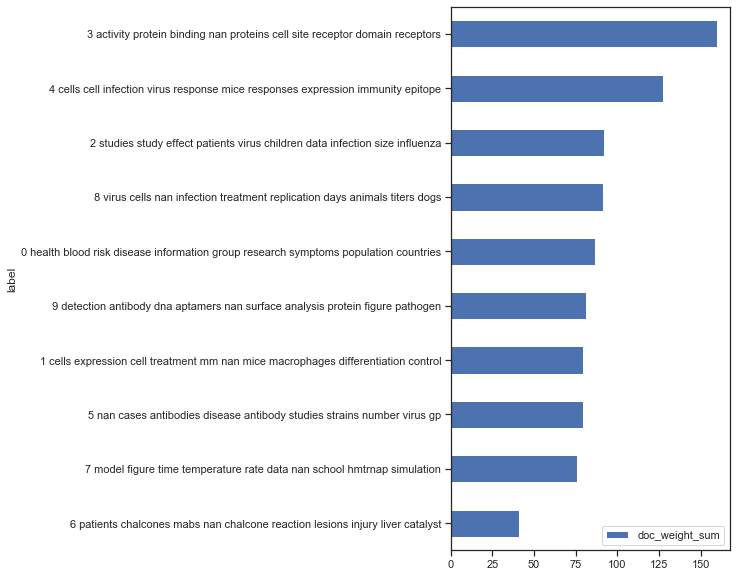

In [414]:
TOPICS.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10)) 

## Add Year information into THETA table to analyze topic models by year

In [415]:
THETA=THETA.reset_index()

In [416]:
THETA=pd.merge(THETA, DOC[['paper_id','year']], on = 'paper_id', how='left')

In [417]:
THETA=THETA.set_index(['year','paper_id','page_num']).sort_index(level=['year','paper_id'])

In [418]:
THETA

0         1         2         3         4  \
year paper_id page_num                                                     
2010 179039   1         0.001924  0.468713  0.001923  0.001923  0.189532   
              2         0.000637  0.000637  0.000637  0.086952  0.330956   
              3         0.000599  0.000599  0.000599  0.283719  0.317979   
              4         0.000735  0.097159  0.000735  0.191288  0.248649   
              5         0.000676  0.000676  0.000676  0.325273  0.175555   
...                          ...       ...       ...       ...       ...   
2020 1601447  2         0.000855  0.228507  0.195437  0.023206  0.072199   
              3         0.000901  0.088350  0.186895  0.041094  0.106649   
              4         0.000971  0.364654  0.098601  0.000971  0.108999   
              5         0.156196  0.000953  0.171257  0.000953  0.033811   
              6         0.196038  0.002174  0.786568  0.002174  0.002174   

                               5         6         7         8         9  
year paper_id page_num                                                    
2010 179039   1         0.328290  0.001923  0.001924  0.001923  0.001923  
              2         0.416547  0.000637  0.103430  0.000637  0.058929  
              3         0.358648  0.036060  0.000599  0.000599  0.000599  
              4         0.409374  0.000735  0.000735  0.049853  0.000736  
              5         0.275442  0.219675  0.000676  0.000676  0.000676  
...                          ...       ...       ...       ...       ...  
2020 1601447  2         0.326195  0.000855  0.000855  0.151036  0.000855  
              3         0.495695  0.077713  0.000901  0.000901  0.000901  
              4         0.144735  0.180269  0.000971  0.098857  0.000971  
              5         0.473659  0.000953  0.000952  0.160315  0.000953  
              6         0.002174  0.002174  0.002174  0.002175  0.002174  

[913 rows x 10 columns]

In [421]:
#save this new theta table, with additional information of year
THETA.to_csv("THETA_year.csv")

## Explore topic by year

In [116]:
topic_cols = [t for t in range(n_topics)]
YEARS = THETA.groupby('year')[topic_cols].mean().T                                            
YEARS.index.name = 'topic_id'

In [117]:
YEARS.T

topic_id,0,1,2,3,4,5,6,7,8,9
year,,,,,,,,,,
2010,0.038368,0.025926,0.170457,0.152839,0.283363,0.074233,0.006112,0.091285,0.149977,0.007440
2011,0.126979,0.100740,0.050480,0.110494,0.116577,0.035563,0.033083,0.140245,0.097160,0.188679
2012,0.229819,0.143459,0.009776,0.194479,0.046226,0.025100,0.018281,0.034231,0.145674,0.152955
2013,0.062840,0.148454,0.120254,0.118687,0.129702,0.042518,0.013386,0.089603,0.090692,0.183864
2014,0.215281,0.166402,0.014049,0.130527,0.271629,0.001907,0.058887,0.016897,0.066904,0.057518
2015,0.106597,0.020910,0.019999,0.251171,0.019738,0.280217,0.009930,0.191115,0.042341,0.057982
2016,0.070163,0.045072,0.197195,0.201357,0.202962,0.141476,0.018488,0.049092,0.053961,0.020235
2017,0.129308,0.059076,0.017001,0.355686,0.032098,0.084928,0.104714,0.118949,0.076584,0.021656
2018,0.029362,0.085369,0.139421,0.137531,0.086770,0.079092,0.077771,0.032527,0.202637,0.129521


In [118]:
YEARS['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)

In [119]:
YEARS.sort_values(2020, ascending=False).style.background_gradient()

year,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,topterms
topic_id,,,,,,,,,,,,
2,0.170457,0.050480,0.009776,0.120254,0.014049,0.019999,0.197195,0.017001,0.139421,0.105904,0.231455,studies study effect patients virus children data infection size influenza
6,0.006112,0.033083,0.018281,0.013386,0.058887,0.009930,0.018488,0.104714,0.077771,0.001702,0.218729,patients chalcones mabs nan chalcone reaction lesions injury liver catalyst
5,0.074233,0.035563,0.025100,0.042518,0.001907,0.280217,0.141476,0.084928,0.079092,0.296838,0.155144,nan cases antibodies disease antibody studies strains number virus gp
8,0.149977,0.097160,0.145674,0.090692,0.066904,0.042341,0.053961,0.076584,0.202637,0.145668,0.110523,virus cells nan infection treatment replication days animals titers dogs
4,0.283363,0.116577,0.046226,0.129702,0.271629,0.019738,0.202962,0.032098,0.086770,0.131241,0.108951,cells cell infection virus response mice responses expression immunity epitope
0,0.038368,0.126979,0.229819,0.062840,0.215281,0.106597,0.070163,0.129308,0.029362,0.004519,0.050252,health blood risk disease information group research symptoms population countries
1,0.025926,0.100740,0.143459,0.148454,0.166402,0.020910,0.045072,0.059076,0.085369,0.116830,0.046461,cells expression cell treatment mm nan mice macrophages differentiation control
7,0.091285,0.140245,0.034231,0.089603,0.016897,0.191115,0.049092,0.118949,0.032527,0.031370,0.032126,model figure time temperature rate data nan school hmtrnap simulation
3,0.152839,0.110494,0.194479,0.118687,0.130527,0.251171,0.201357,0.355686,0.137531,0.138836,0.025451,activity protein binding nan proteins cell site receptor domain receptors


In [120]:
px.scatter(YEARS.reset_index(), 2011, 2020, hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

# VII. Word Embedding 

In [121]:
from gensim.models import word2vec
from sklearn.manifold import TSNE

In [122]:
TOKEN.shape

(432335, 9)

In [123]:
TOKEN.head(5)

,paper_id,page_num,line_num,token_num,pos_tuple,pos,token_str,term_str,term_id
0,1017171,1,1,0,"('Protocells,', 'NNP')",NNP,"Protocells,",protocells,17875
1,1017171,1,1,1,"('as', 'IN')",IN,as,as,2318
2,1017171,1,1,2,"('the', 'DT')",DT,the,the,21804
3,1017171,1,1,3,"('most', 'RBS')",RBS,most,most,14311
4,1017171,1,1,4,"('simplified', 'JJ')",JJ,simplified,simplified,20239


In [124]:
DOC.head(5)

,paper_id,title,author,year,title_year
0,1017171,Constructing Smart Protocells with Built-In DN...,"Yifan Lyu, Cuichen Wu, Charles Heinke, Da Han,...",2018,2018 Constructing Smart Protocells with Built-...
1,1022449,The National Ebola Training and Education Cent...,"Christopher J. Kratochvil, Laura Evans, Bruce ...",2017,2017 The National Ebola Training and Education...
2,1047526,Remdesivir (GS-5734) protects African green mo...,"Michael K. Lo, Friederike Feldmann, Joy M. Gar...",2019,2019 Remdesivir (GS-5734) protects African gre...
3,1061612,Public Health Surveillance: At the Core of the...,"Sara Beth Wolicki, Jennifer B. Nuzzo, David L....",2016,2016 Public Health Surveillance: At the Core o...
4,1528726,Interferon Regulatory Factor 3 plays a role in...,"Zachary P. Guinn, Thomas M. Petro",2019,2019 Interferon Regulatory Factor 3 plays a ro...


In [434]:
TOKEN2=pd.merge(TOKEN, DOC[['paper_id','year']], on = 'paper_id', how='left')

In [126]:
TOKEN2

,paper_id,page_num,line_num,token_num,pos_tuple,pos,token_str,term_str,term_id,year
0,1017171,1,1,0,"('Protocells,', 'NNP')",NNP,"Protocells,",protocells,17875,2018
1,1017171,1,1,1,"('as', 'IN')",IN,as,as,2318,2018
2,1017171,1,1,2,"('the', 'DT')",DT,the,the,21804,2018
3,1017171,1,1,3,"('most', 'RBS')",RBS,most,most,14311,2018
4,1017171,1,1,4,"('simplified', 'JJ')",JJ,simplified,simplified,20239,2018
...,...,...,...,...,...,...,...,...,...,...
432330,978331,13,978,1,"('would', 'MD')",MD,would,would,23778,2016
432331,978331,13,978,2,"('appear', 'VB')",VB,appear,appear,2126,2016
432332,978331,13,978,3,"('and', 'CC')",CC,and,and,1808,2016
432333,978331,13,978,4,"('be', 'VB')",VB,be,be,2913,2016


## Import data from TOKEN table, excluding proper nouns 

In [127]:
BAG=['paper_id','page_num']

corpus = TOKEN2[~TOKEN2.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [136]:
len(corpus)

914

## Generate word embedding with Gensim's library

In [140]:
#setting workers=1 to ensure a consistent result when re-run
model = word2vec.Word2Vec(corpus, size=200, window=5, min_count=50, workers=1, seed=100)

In [141]:
coords = pd.DataFrame(index=range(len(model.wv.vocab)))
coords['label'] = [w for w in model.wv.vocab]
coords['vector'] = coords['label'].apply(lambda x: model.wv.get_vector(x))

## Use TSNE library, convert to 2D for visualization

In [144]:
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
tsne_values = tsne_model.fit_transform(coords['vector'].tolist())

In [145]:
coords['x'] = tsne_values[:,0]
coords['y'] = tsne_values[:,1]

In [502]:
coords.sample(5)

,label,vector,x,y
310,either,"[0.059084352, -0.21115091, 0.21218383, 0.04417...",27.913654,-9.076933
809,table,"[-0.3510168, -0.3124343, 0.36051694, 0.1316793...",45.655354,-4.123344
265,prevent,"[0.012996922, 0.053032327, 0.1687218, 0.041764...",-25.859322,3.142342
788,ph,"[-0.05947155, -0.49113286, 0.41209814, 0.11619...",47.468796,2.676204
749,among,"[-0.18743598, 0.05462067, 0.14494395, 0.077900...",4.433771,7.793310


In [424]:
# save word embedding with TSNE 2D values for visualization. 
# The column "label" here can be matched to the column "term_str" in SIGS, or VOCAB, or TOKEN table
# however this coords table has much less rows since min_count is 50.
coords.to_csv('coords.csv')

In [151]:
px.scatter(coords, 'x', 'y', text='label', height=1000).update_traces(mode='text')

* (50, 2): min, nm, ul, mm, h, buffer, concentration, temperature, room, ph, samples: experimental conditions
* (15,10): structures, crystal, backbone, xray, cysteine, hydrophobic, bond: structural biology 
* (18, -8.5): dementia and diabetes, two diseases that related to old age
* (20,9): protease, enzyme
* (7,-9): decrease, increase

## Semantic Algebra

### Analogy

$A : B :: C : D? \rightarrow B - A + C = D$


In [162]:
def complete_analogy(A, B, C, n=2):
    try:
        return model.wv.most_similar(positive=[B, C], negative=[A])[0:n]
    except KeyError as e:
        print('Error:', e)
        return None

In [163]:
complete_analogy('enzyme', 'protein', 'influenza')

[('viruses', 0.8855375051498413), ('other', 0.8026105761528015)]

In [165]:
complete_analogy('protein', 'research', 'influenza')

[('disease', 0.9146808981895447), ('clinical', 0.8634476065635681)]

In [181]:
complete_analogy('second', 'h', 'ml')

[('μl', 0.8963992595672607), ('incubated', 0.8917982578277588)]

In [182]:
complete_analogy('virus', 'infection', 'antiviral')

[('responses', 0.9701334238052368), ('immune', 0.9535723328590393)]

In [191]:
complete_analogy('human', 'influenza', 'mouse')

[('bacterial', 0.9166236519813538), ('avian', 0.9156056046485901)]

In [197]:
complete_analogy('protein','activity','drug')

[('effective', 0.8719230890274048), ('do', 0.8686914443969727)]

In [212]:
complete_analogy('bacteria','antibiotic','virus',n=10)

[('respiratory', 0.8814536333084106),
 ('treatment', 0.869175910949707),
 ('infection', 0.8561900854110718),
 ('lung', 0.8222895860671997),
 ('acute', 0.8112511038780212),
 ('ear', 0.7773705124855042),
 ('viral', 0.775701105594635),
 ('during', 0.7540155649185181),
 ('infected', 0.7383149266242981),
 ('titers', 0.7378670573234558)]

In [213]:
complete_analogy('virus','vaccine', 'influenza',n=10)

[('research', 0.9786214828491211),
 ('training', 0.9662089943885803),
 ('efforts', 0.966168224811554),
 ('agents', 0.9552550315856934),
 ('new', 0.9526211023330688),
 ('use', 0.9507676362991333),
 ('discovery', 0.9498867988586426),
 ('drug', 0.9494947791099548),
 ('strategies', 0.9479659795761108),
 ('future', 0.9472651481628418)]

# VIII. Sentimental Analysis

In [425]:
OHCO = ['year','paper_id', 'page_num', 'line_num'] 
PAPERS = OHCO[1:2]
PAGES = OHCO[:3]
LINES = OHCO[:4]

salex_csv = 'salex_nrc.csv'
nrc_cols = "nrc_negative nrc_positive nrc_anger nrc_anticipation nrc_disgust nrc_fear nrc_joy nrc_sadness nrc_surprise nrc_trust".split()
emo = 'polarity'

### Get Lexicon

In [223]:
salex = pd.read_csv(salex_csv).set_index('term_str')
salex.columns = [col.replace('nrc_','') for col in salex.columns]
salex['polarity'] = salex.positive - salex.negative

In [224]:
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

### Get TOKEN table from all Papers 

In [435]:
TOKEN2.head(10)

,index,paper_id,page_num,line_num,token_num,pos_tuple,pos,token_str,term_str,term_id,year
0,0,1017171,1,1,0,"('Protocells,', 'NNP')",NNP,"Protocells,",protocells,17875,2018
1,1,1017171,1,1,1,"('as', 'IN')",IN,as,as,2318,2018
2,2,1017171,1,1,2,"('the', 'DT')",DT,the,the,21804,2018
3,3,1017171,1,1,3,"('most', 'RBS')",RBS,most,most,14311,2018
4,4,1017171,1,1,4,"('simplified', 'JJ')",JJ,simplified,simplified,20239,2018
5,5,1017171,1,1,5,"('prototype', 'NN')",NN,prototype,prototype,17890,2018
6,6,1017171,1,1,6,"('of', 'IN')",IN,of,of,15546,2018
7,7,1017171,1,1,7,"('artificial', 'JJ')",JJ,artificial,artificial,2308,2018
8,8,1017171,1,1,8,"('cell,', 'NNS')",NNS,"cell,",cell,4142,2018
9,9,1017171,1,1,9,"('have', 'VBP')",VBP,have,have,9910,2018


In [436]:
TOKEN2 =TOKEN2.set_index(OHCO).sort_index()

In [339]:
TOKEN2

token_num             pos_tuple  pos  \
year paper_id page_num line_num                                         
2010 179039   1        1                 0         ('The', 'DT')   DT   
                       1                 1      ('recent', 'JJ')   JJ   
                       1                 2     ('failure', 'NN')   NN   
                       1                 3          ('of', 'IN')   IN   
                       1                 4         ('the', 'DT')   DT   
...                                    ...                   ...  ...   
2020 1601447  6        377               0  ('enrolling', 'VBG')  VBG   
                       377               1      ('cancer', 'NN')   NN   
                       377               2   ('patients', 'NNS')  NNS   
                       377               3      ('(Table', 'JJ')   JJ   
                       377               4         ('3).', 'CD')   CD   

                                 token_str   term_str  term_id  
year paper_id page_num line_num                                 
2010 179039   1        1               The        the    21804  
                       1            recent     recent    18449  
                       1           failure    failure     8352  
                       1                of         of    15546  
                       1               the        the    21804  
...                                    ...        ...      ...  
2020 1601447  6        377       enrolling  enrolling     7751  
                       377          cancer     cancer     3786  
                       377        patients   patients    16291  
                       377          (Table      table    21473  
                       377             3).        nan        0  

[432335 rows x 6 columns]

In [437]:
TOKEN2 = TOKEN2.join(salex, on='term_str', how='left')
TOKEN2[emo_cols] = TOKEN2[emo_cols].fillna(0)

In [489]:
TOKEN2.sample(10)

,,,,index,token_num,pos_tuple,pos,token_str,term_str,term_id,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
year,paper_id,page_num,line_num,,,,,,,,,,,,,,,,,,
2015,678786,7,483,58832,2,"('activity', 'NN')",NN,activity,activity,1155,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2016,850915,9,656,78162,12,"('differentiate', 'VB')",VB,differentiate,differentiate,6592,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2015,875513,5,301,354691,4,"('to', 'TO')",TO,to,to,22066,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2011,289449,11,645,151707,4,"('and', 'CC')",CC,and,and,1808,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2013,491749,4,260,256843,1,"('seven', 'CD')",CD,seven,seven,19984,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2011,262697,6,349,139670,14,"('Th17', 'NNP')",NNP,Th17,th,21789,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2016,4909,16,1199,255152,4,"('and', 'CC')",CC,and,and,1808,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2010,219385,14,924,132384,3,"('BCG-induced', 'NNP')",NNP,BCG-induced,bcginduced,2906,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2013,533628,3,145,268404,8,"('relies', 'NNS')",NNS,relies,relies,18702,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0


In [449]:
TOKEN2[emo_cols]=TOKEN2[emo_cols].fillna(0)

In [452]:
#saves TOKEN2 as sentimental values embedded csv as TOKEN_SA.csv
#OHCO= ['year','paper_id','page_num','line_num']
TOKEN2.to_csv('TOKEN_SA.csv')

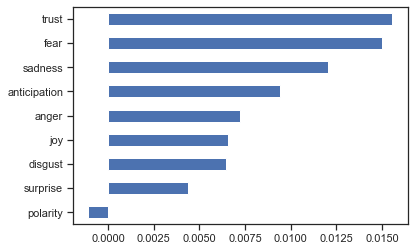

In [345]:
TOKEN2[emo_cols].mean().sort_values().plot.barh()

### Sentiment by Pages

In [346]:
TOKEN_pages=TOKEN2.groupby(PAGES)[emo_cols].mean()

In [347]:
def plot_sentiments(df, emo='polarity'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
    df[emo].plot(**FIG)

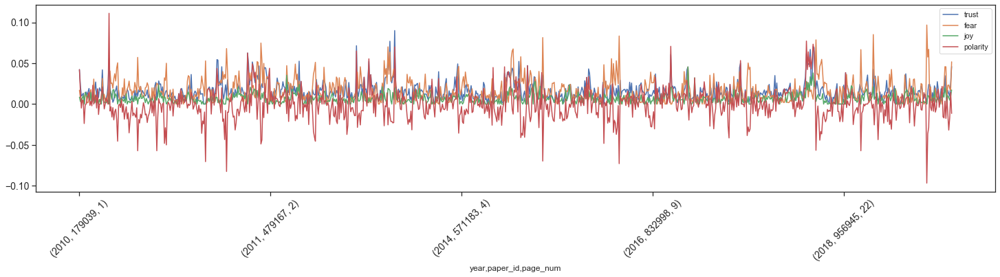

In [348]:
plot_sentiments(TOKEN_pages, ['trust','fear','joy','polarity'])

### Explore Sentiment in Texts

In [349]:
TOKEN2['html'] =  TOKEN2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)

In [350]:
TOKEN2['html'].sample(10)

year  paper_id  page_num  line_num
2016  783958    3         176           <span class='sent0'>RNA</span>
2011  300191    5         289         <span class='sent0'>could</span>
2016  806465    6         410           <span class='sent0'>>90</span>
2018  956945    24        1555        <span class='sent0'>using</span>
2016  751259    5         335           <span class='sent0'>had</span>
2019  1528726   9         654           <span class='sent0'>was</span>
2013  482721    3         100           <span class='sent0'>not</span>
2016  806465    5         330            <span class='sent0'>mM</span>
2011  289449    10        602            <span class='sent0'>in</span>
2016  832998    11        800         <span class='sent0'>vivo.</span>
Name: html, dtype: object

In [351]:
LINES

['year', 'paper_id', 'page_num', 'line_num']

In [352]:
TOKEN2_lines=TOKEN2.groupby(LINES)[emo_cols].mean()
TOKEN2_lines['line_str'] = TOKEN2.groupby(LINES).term_str.apply(lambda x: x.str.cat(sep=' '))
TOKEN2_lines['html_str'] = TOKEN2.groupby(LINES).html.apply(lambda x: x.str.cat(sep=' '))

In [353]:
from IPython.core.display import display, HTML

def sample_lines(df):
    rows = []
    for idx in df.sample(10).index:

        valence = round(df.loc[idx, emo], 4)     
        t = 0
        if valence > t: color = '#ccffcc'
        elif valence < t: color = '#ffcccc'
        else: color = '#f2f2f2'
        z=0
        rows.append("""<tr style="background-color:{0};padding:.5rem 1rem;font-size:110%;">
        <td>{1}</td><td>{3}</td><td width="400" style="text-align:left;">{2}</td>
        </tr>""".format(color, valence, df.loc[idx, 'html_str'], idx))

    display(HTML('<style>#sample1 td{font-size:120%;vertical-align:top;} .sent-1{color:red;font-weight:bold;} .sent1{color:green;font-weight:bold;}</style>'))
    display(HTML('<table id="sample1"><tr><th>Sentiment</th><th>ID</th><th width="600">Line</th></tr>'+''.join(rows)+'</table>'))

In [328]:
sample_lines(TOKEN2_lines)

Sentiment,ID,Line
0.0,"(1528726, 3, 180)","cells, which produce SEAP under the control of the ISG54 promoter. Using this approach,"
0.0,"(536452, 8, 490)","mechanism for the intrinsic ‘browning’ of WAT remains unclear105. However, it was"
0.0,"(608631, 3, 156)",Criteria for selection of cases
0.0,"(488553, 5, 299)",differentiation between normal skin and the hemangioma. Eighteen newborns with
0.0,"(491749, 10, 710)",referral hospitals hindered separation of drug-resistant TB patients and suspects; physical
-0.0769,"(746332, 5, 339)",characteristic of the latter two abnormalities from osteonecrosis or metastatic disease is the
0.0,"(772392, 6, 413)",Numerous studies have been published to date on the association between blood groups and
0.0,"(960656, 15, 1142)","Considering that α-glucosidase is a host factor, and that high doses of iminosugars are not"
0.0,"(850915, 14, 1049)","2014; Wolery et al., 2010). For example, consider an intervention study in which two"
0.0,"(746332, 1, 11)",Osteonecrosis is a significant long-term toxicity that can compromise joint functionality and


### VADER

In [354]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

In [492]:
TOKEN2_vader_cols = TOKEN2_lines.line_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
VADER = pd.concat([TOKEN2_lines, TOKEN2_vader_cols], axis=1)

In [493]:
VADER.sample(5)

anger  anticipation  disgust      fear  joy  \
year paper_id page_num line_num                                                
2017 909180   8        569         0.0      0.000000      0.0  0.000000  0.0   
2013 700603   4        217         0.0      0.000000      0.0  0.000000  0.0   
2016 794695   11       866         0.0      0.000000      0.0  0.000000  0.0   
     806465   3        147         0.0      0.000000      0.0  0.000000  0.0   
2017 960656   19       1477        0.0      0.066667      0.0  0.066667  0.0   

                                 sadness  surprise  trust  polarity  \
year paper_id page_num line_num                                       
2017 909180   8        569           0.0       0.0    0.0       0.0   
2013 700603   4        217           0.0       0.0    0.0       0.0   
2016 794695   11       866           0.0       0.0    0.0       0.0   
     806465   3        147           0.0       0.0    0.0       0.0   
2017 960656   19       1477          0.0       0.0    0.0       0.0   

                                                                          line_str  \
year paper_id page_num line_num                                                      
2017 909180   8        569       smooth muscle cells adipocytes and macrophages...   
2013 700603   4        217       antibody concentration was nan nan nan nan nan...   
2016 794695   11       866       index values greater than nan all compounds we...   
     806465   3        147       of mammalian cells and the nsp proteasesam mta...   
2017 960656   19       1477      mutation in the ns helicase domain was identif...   

                                                                          html_str  \
year paper_id page_num line_num                                                      
2017 909180   8        569       <span class='sent0'>smooth</span> <span class=...   
2013 700603   4        217       <span class='sent0'>antibody</span> <span clas...   
2016 794695   11       866       <span class='sent0'>index</span> <span class='...   
     806465   3        147       <span class='sent0'>of</span> <span class='sen...   
2017 960656   19       1477      <span class='sent0'>mutation</span> <span clas...   

                                 neg    neu    pos  compound  
year paper_id page_num line_num                               
2017 909180   8        569       0.0  1.000  0.000    0.0000  
2013 700603   4        217       0.0  0.844  0.156    0.3400  
2016 794695   11       866       0.0  0.698  0.302    0.6369  
     806465   3        147       0.0  0.875  0.125    0.2500  
2017 960656   19       1477      0.0  0.912  0.088    0.0900

In [494]:
#save this VADER value embedded TOKEN table, this table can be matched with TOKEN table at the line level
#OHCO= ['year','paper_id','page_num','line_num']
VADER.to_csv('VADER.csv')

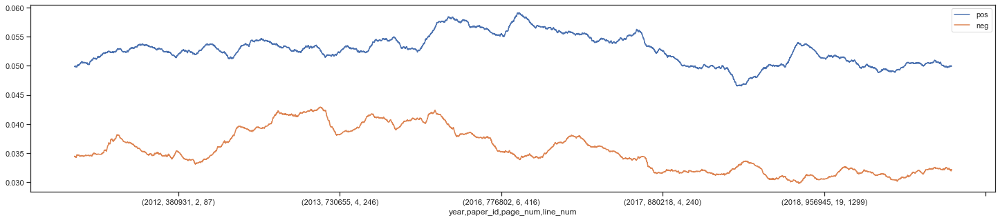

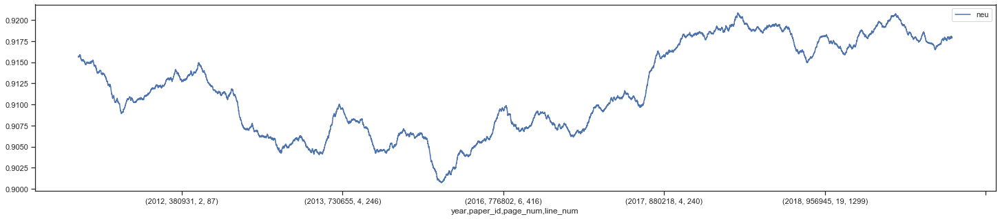

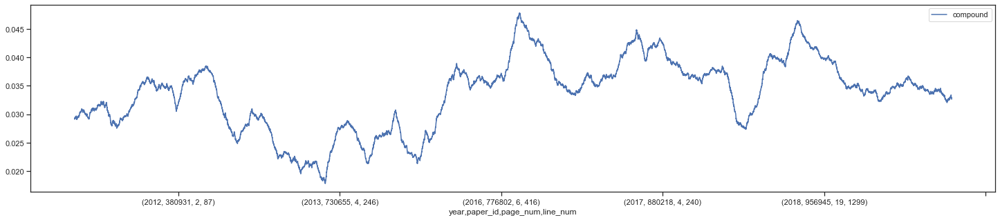

In [496]:
w = int(VADER.shape[0] / 5)
VADER[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
VADER[['neu']].rolling(w).mean().plot(figsize=(25,5))
VADER[['compound']].rolling(w).mean().plot(figsize=(25,5))